In [1]:
import os
import csv
import gc
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torchvision.io import read_image
from torchvision import models
from torchvision.transforms import v2 as transforms
from torch.utils.data import Dataset, SubsetRandomSampler
from safetensors.torch import save_model, load_model
import torchvision.transforms.functional as F

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
class SquarePad:
    def __call__(self, image):
        c, h, w = image.size()
        max_wh = np.max([w, h])
        hp = (max_wh - w) // 2 + max_wh // 10
        vp = (max_wh - h) // 2 + max_wh // 10
        padding = (hp, vp, hp, vp)
        return F.pad(image, padding, 1, 'constant')

def image_transform(test=False):
    # normalize = transforms.Normalize(
    #     mean=[0.4914, 0.4822, 0.4465],
    #     std=[0.2023, 0.1994, 0.2010],
    # )
    mid_transforms = [
    ] if test else [
        # transforms.RandomHorizontalFlip(),
        # transforms.RandomVerticalFlip(),
        transforms.RandomAffine(degrees=10, translate=(0.1,0.1), scale=(0.9,1.1)),
        transforms.ColorJitter(),
        # transforms.GaussianBlur(5),
    ]
    return transforms.Compose([
        transforms.ConvertImageDtype(torch.float),
        transforms.RGB(),
        SquarePad(),
    ] + mid_transforms + [
        transforms.Resize((224,224)),
        # normalize,
        transforms.Lambda(lambda x: torch.clamp(x, 0, 1))
    ])


def load_image(path):
    transform = image_transform(test=True)
    image = read_image(path)
    image = transform(image)
    return image

In [4]:
def load_paths(root_dir) -> list:
    filenames = next(os.walk(root_dir), (None, None, []))[2]
    return [os.path.join(root_dir, filename) for filename in filenames]

In [5]:
images_path = '../data/logos'

In [6]:
max_width = 0
max_height = 0
min_width = 1000
min_height = 1000
for path in load_paths(images_path)[:5]:
    image = read_image(path)
    assert image.size()[0] == 3
    width, height = image.size()[1], image.size()[2]
    max_width = max(max_width, width)
    max_height = max(max_height, height)
    min_width = min(min_width, width)
    min_height = min(min_height, height)
print(f'Min size: {min_width}x{min_height}')
print(f'Max size: {max_width}x{max_height}')

Min size: 334x553
Max size: 944x944


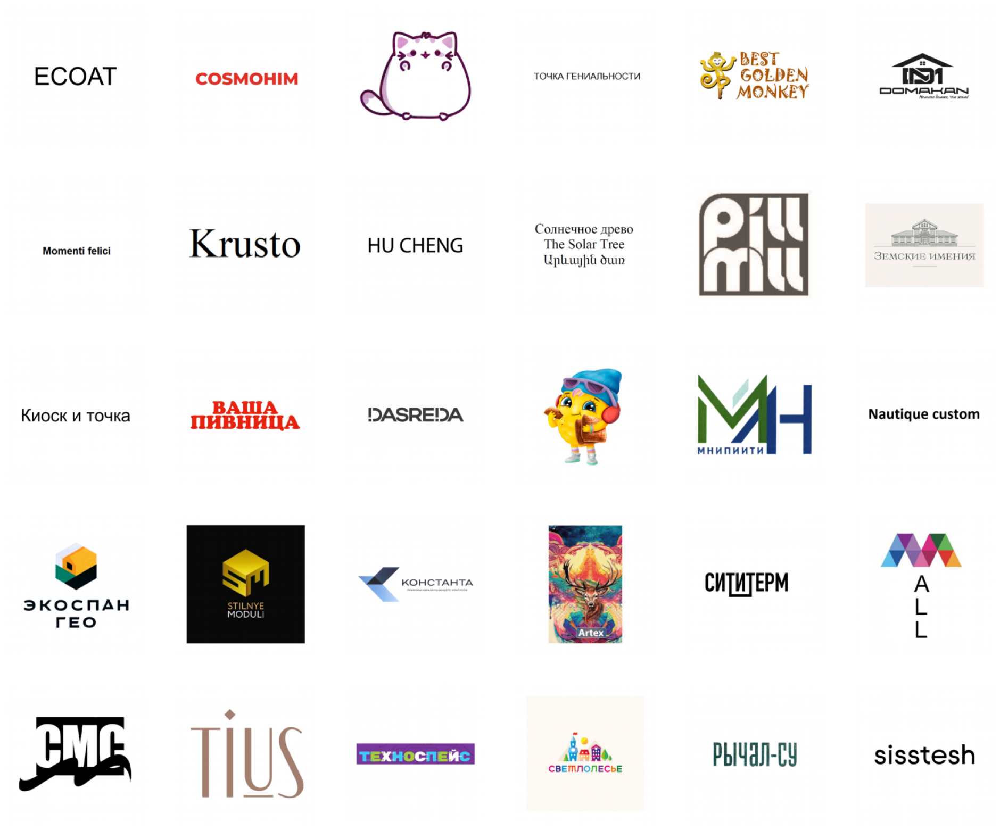

In [7]:
w, h = 6, 5
_, axs = plt.subplots(h, w, figsize=(w * 4, h * 4))

images = load_paths(images_path)

image_paths = []
np.random.shuffle(images)
image_paths.extend(images)

for i, (img_path, ax) in enumerate(zip(image_paths, axs.flatten())):
    img = load_image(img_path)
    #prediction = model(img.unsqueeze(0).to(device)).item()

    ax.imshow(img.transpose(0,1).transpose(1,2))
    ax.set_axis_off()
    #ax.set_title(f'Labelled: {label:.0f}, Predicted: {prediction:.0f}')

plt.show()

In [8]:
class LogosDataset(Dataset):
    def __init__(self, root_dir, frames_limit=None, transform=None):
        self.root = root_dir
        self.transform = transform

        self.images = []

        images = load_paths(root_dir)
        image_paths = []

        if frames_limit is None:
            image_paths = images
        else:
            np.random.shuffle(images)
            image_paths.extend(images[:frames_limit])

        self.images.extend(image_paths)

        print(f'loaded {len(self.images)} paths')

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = read_image(img_path)
        if self.transform:
            image = self.transform(image)
        return image, img_path

In [9]:
def data_loader(data_dir, batch_size, frames_limit=None, shuffle=True, test=False):
    transform = image_transform(test)
    dataset = LogosDataset(data_dir, frames_limit, transform)

    indices = list(range(len(dataset)))
    if shuffle:
        np.random.shuffle(indices)

    sampler = SubsetRandomSampler(indices)
    loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=sampler)
    return loader

In [10]:
loader = data_loader('../data/logos', 32)

loaded 1000 paths


In [11]:
model = models.vgg16(weights=models.VGG16_Weights.DEFAULT).to(device)
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

cuda
loaded 1000 paths


100%|██████████| 63/63 [02:42<00:00,  2.58s/it]


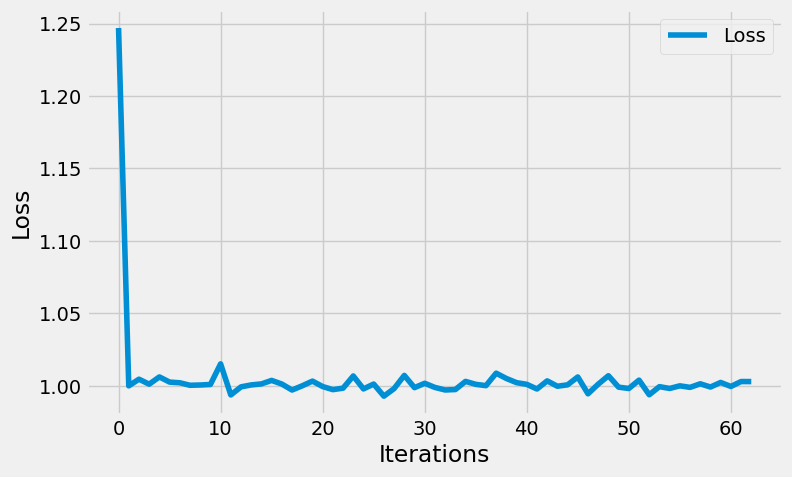

In [12]:
gc.collect()
torch.cuda.empty_cache()

loss_function = nn.TripletMarginWithDistanceLoss(distance_function=nn.CosineSimilarity())
optimizer = torch.optim.Adam(model.parameters(), lr=0.0025, weight_decay=1e-8)

epochs = 1
losses = []

print(device)
model.to(device)
model.train()

all_paths = load_paths('../data/logos')
train_loader = data_loader('../data/logos', 16)

# Training
for epoch in range(epochs):
    for images, image_paths in tqdm(train_loader):
        images = images.to(device)
        encoded = model(images)

        # Get same images with extra noise
        transform = image_transform(test=False)
        noised_images = torch.stack([transform(read_image(path)) for path in image_paths]).to(device)
        encoded_noised = model(noised_images)

        # Get other images for negative examples
        other_paths = np.random.randint(0, len(all_paths), size=len(image_paths))
        other_images = torch.stack([transform(read_image(all_paths[i])) for i in other_paths]).to(device)
        encoded_other = model(other_images)

        loss = loss_function(encoded.unsqueeze(0), encoded_noised.unsqueeze(0), encoded_other.unsqueeze(0))
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses.append(loss.item())

torch.cuda.empty_cache()
model.eval()
plt.style.use('fivethirtyeight')
plt.figure(figsize=(8, 5))
plt.plot(losses, label='Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [13]:
def generate_embeddings(model):
    model = model.to(device)
    embeddings = torch.tensor([]).to(device)
    all_paths = []
    for images, paths in tqdm(loader):
        encoding = model(images.to(device)).detach()
        embeddings = torch.cat((embeddings, encoding))
        all_paths += paths
    return embeddings, all_paths

In [14]:
image_embeddings, image_embedding_paths = generate_embeddings(model)
image_embeddings

  0%|          | 0/32 [00:00<?, ?it/s]

100%|██████████| 32/32 [00:40<00:00,  1.25s/it]


tensor([[-1.4798e+13, -1.1464e+13,  1.9732e+13,  ..., -1.9324e+13,
          9.7106e+12,  1.4258e+13],
        [-1.4740e+13, -1.1419e+13,  1.9655e+13,  ..., -1.9248e+13,
          9.6725e+12,  1.4202e+13],
        [-1.4934e+13, -1.1569e+13,  1.9912e+13,  ..., -1.9502e+13,
          9.7991e+12,  1.4389e+13],
        ...,
        [-1.4683e+13, -1.1375e+13,  1.9579e+13,  ..., -1.9174e+13,
          9.6351e+12,  1.4147e+13],
        [-1.4906e+13, -1.1548e+13,  1.9875e+13,  ..., -1.9465e+13,
          9.7811e+12,  1.4362e+13],
        [-1.4711e+13, -1.1397e+13,  1.9616e+13,  ..., -1.9211e+13,
          9.6536e+12,  1.4175e+13]], device='cuda:0')

In [15]:
def compute_similarity(image_path, embeddings):
    image = load_image(image_path)
    encoded = model.to(device)(image.unsqueeze(0).to(device)).detach()

    similarity_fn = nn.MSELoss()
    def similarity(other_enc):
        return similarity_fn(encoded, other_enc)
    similarity_vec = torch.vmap(similarity)
    return similarity_vec(embeddings)

In [16]:
compute_similarity(image_embedding_paths[0], image_embeddings)

/home/nertsal/Innopolis/Industrial/VisualAutoencoder/.direnv/python-3.11/lib/python3.11/site-packages/torch/nn/modules/loss.py:634: UserWarning: Using a target size (torch.Size([1000])) that is different to the input size (torch.Size([1, 1000])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


tensor([1.6703e+21, 9.9812e+21, 9.3267e+21, 1.8140e+21, 1.4183e+23, 1.4740e+23,
        2.1320e+24, 1.0893e+21, 4.0121e+21, 2.4683e+21, 9.0964e+22, 4.0938e+22,
        3.4475e+21, 4.2781e+20, 7.6940e+20, 2.0041e+23, 6.7369e+22, 3.6390e+22,
        1.6708e+22, 2.6466e+22, 1.8609e+21, 1.5612e+22, 1.2043e+22, 9.3814e+22,
        5.4455e+21, 4.3461e+22, 1.0253e+21, 1.4310e+20, 1.7413e+22, 1.8571e+22,
        1.4165e+22, 5.4867e+21, 7.6688e+22, 1.2016e+22, 7.2719e+17, 6.9981e+19,
        1.3503e+21, 2.4602e+22, 1.2167e+22, 8.6995e+22, 1.0847e+22, 1.2872e+22,
        2.8681e+20, 7.7491e+22, 3.3948e+20, 7.0601e+22, 1.5675e+22, 1.6504e+23,
        5.3091e+21, 2.9422e+22, 2.2398e+22, 1.7343e+23, 5.0663e+23, 7.9206e+22,
        1.1602e+22, 1.0576e+22, 6.4597e+22, 3.1523e+22, 1.3778e+22, 3.2329e+20,
        4.7154e+22, 8.3704e+20, 2.4717e+20, 3.7009e+22, 1.2488e+21, 2.0508e+21,
        6.7254e+21, 4.0009e+22, 9.2702e+22, 5.4015e+21, 7.2668e+21, 2.1291e+24,
        1.1714e+21, 9.7894e+22, 2.4482e+

10it [00:00, 22.06it/s]


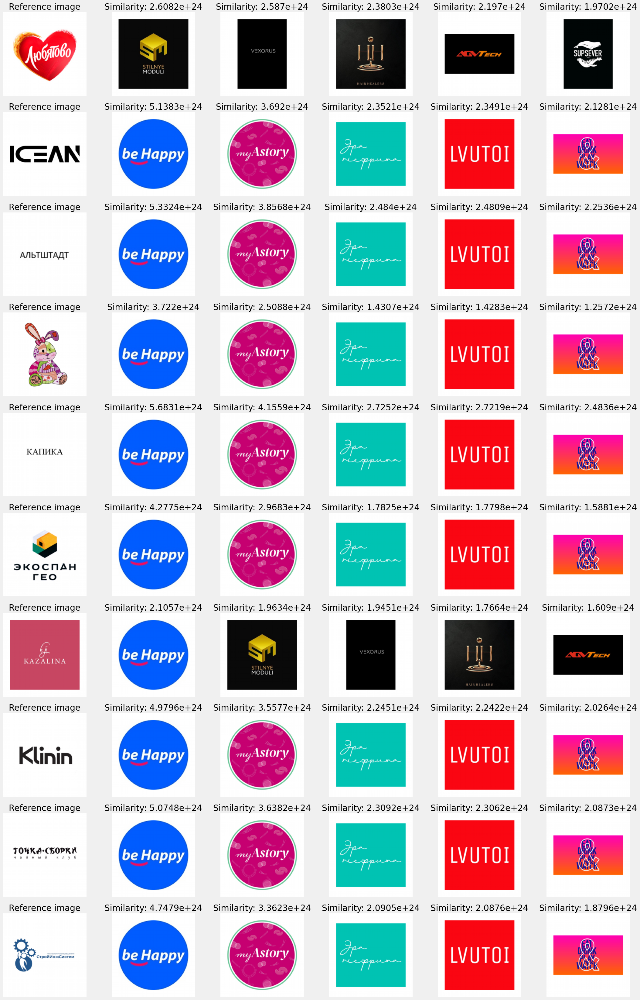

In [17]:
w, h = 6, 10
_, axs = plt.subplots(h, w, figsize=(w * 4, h * 4))

images = load_paths(images_path)

image_paths = []
np.random.shuffle(images)
image_paths.extend(images)

model.eval()
for i, ax_row in tqdm(enumerate(axs)):
    img_path = image_paths[i]
    
    similarities = compute_similarity(img_path, image_embeddings).cpu().numpy().flatten()
    top_images = np.argsort(similarities)[::-1]

    for i, ax in enumerate(ax_row):
        if i == 0:
            img = load_image(img_path)
            ax.set_title('Reference image')
        else:
            idx = top_images[i - 1]
            img = load_image(image_embedding_paths[idx])
            similarity = similarities[idx]
            ax.set_title(f'Similarity: {similarity:.5}')
        ax.set_axis_off()
        ax.imshow(img.transpose(0,1).transpose(1,2))

plt.show()

10it [00:00, 20.61it/s]


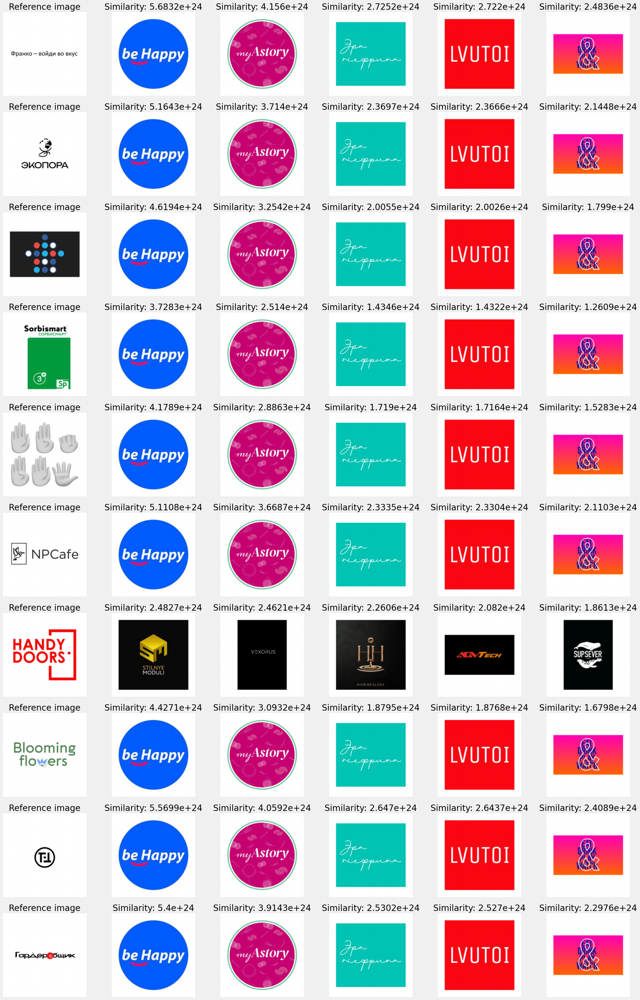

In [18]:
w, h = 6, 10
_, axs = plt.subplots(h, w, figsize=(w * 4, h * 4))

images = load_paths(images_path)

image_paths = []
np.random.shuffle(images)
image_paths.extend(images)

similarity_fn = nn.CosineSimilarity()
model.eval()
for i, ax_row in tqdm(enumerate(axs)):
    img_path = image_paths[i]
    
    similarities = compute_similarity(img_path, image_embeddings).cpu().numpy().flatten()
    top_images = np.argsort(similarities)[::-1]

    for i, ax in enumerate(ax_row):
        if i == 0:
            img = load_image(img_path)
            ax.set_title('Reference image')
        else:
            idx = top_images[i - 1]
            img = load_image(image_embedding_paths[idx])
            similarity = similarities[idx]
            ax.set_title(f'Similarity: {similarity:.5}')
        ax.set_axis_off()
        ax.imshow(img.transpose(0,1).transpose(1,2))

plt.show()

10it [00:00, 22.36it/s]


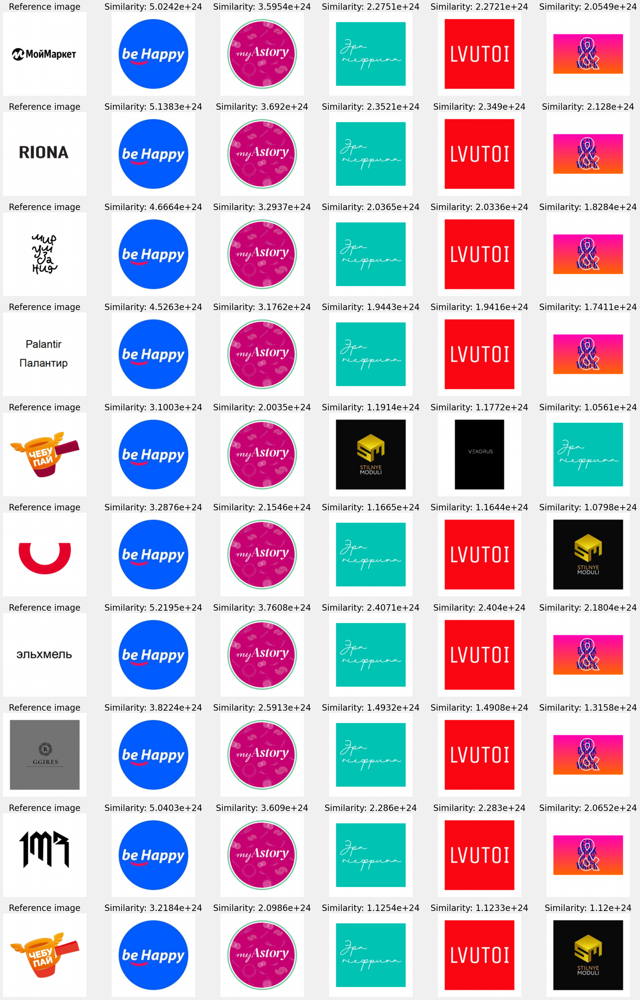

In [19]:
w, h = 6, 10
_, axs = plt.subplots(h, w, figsize=(w * 4, h * 4))

images = load_paths(images_path)

image_paths = []
np.random.shuffle(images)
image_paths.extend(images)

similarity_fn = nn.CosineSimilarity()
model.eval()
for i, ax_row in tqdm(enumerate(axs)):
    img_path = image_paths[i]
    
    similarities = compute_similarity(img_path, image_embeddings).cpu().numpy().flatten()
    top_images = np.argsort(similarities)[::-1]

    for i, ax in enumerate(ax_row):
        if i == 0:
            img = load_image(img_path)
            ax.set_title('Reference image')
        else:
            idx = top_images[i - 1]
            img = load_image(image_embedding_paths[idx])
            similarity = similarities[idx]
            ax.set_title(f'Similarity: {similarity:.5}')
        ax.set_axis_off()
        ax.imshow(img.transpose(0,1).transpose(1,2))

plt.show()